In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python

import io # Input/Output Module
import os # OS interfaces
import cv2 # OpenCV package
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from urllib import request # module for opening HTTP requests
from matplotlib import pyplot as plt # Plotting library


<div style="width:100%; height:140px">
    <img src="https://www.kuleuven.be/internationaal/thinktank/fotos-en-logos/ku-leuven-logo.png/image_preview" width = auto, heigh = 200px align=left>
</div>


KUL H02A5a Computer Vision: Group Assignment 1
---------------------------------------------------------------
<div style="height:50px"></div>

<span style="color:red">**TODO**: Add your names below.</span>

<span style="color:red">**TODO**: Change the notebook name by replacing the X with your actual group number.</span>

Student names: <span style="color:red">Hung Sum So (r0727162), Jenny Liahjell (r1085066), ...</span>.

The goal of this assignment is to explore more advanced techniques for constructing features that better describe objects of interest and to perform face recognition using these features. This assignment will be delivered in groups of 5 (either composed by you or randomly assigned by your TA's).

---------------------------------------------------------------
This notebook is structured as follows:

0. Data loading & Preprocessing
1. Feature Representations
2. Evaluation Metrics 
3. Classifiers
4. Experiments
5. Publishing best results
6. Discussion

Make sure that your notebook is **self-contained** and **fully documented**. Provide strong arguments for the design choices that you made and what insights you got from your experiments. Make use of the *Group assignment 1* forum/discussion board on Toledo if you have any questions.

Good luck! 


<div class="alert alert-block alert-info">
<b>NOTE:</b> This notebook is just a example/template, feel free to adjust in any way you please! Just keep things organised and document accordingly!
</div>

<div class="alert alert-block alert-info">
<b>NOTE:</b> Clearly indicate the improvements that you make!!! You can for instance use titles like: <i>3.1. Improvement: Non-linear SVM with RBF Kernel.<i>
</div>
    
---------------------------------------------------------------
# 0. Data loading & Preprocessing

## 0.1. Loading data
The training set is many times smaller than the test set and this might strike you as odd, however, this is close to a real world scenario where your system might be put through daily use! In this session we will try to do the best we can with the data that we've got! 

In [2]:
# Input data files are available in the read-only "../input/" directory

train = pd.read_csv(
    './kaggle/input/kul-computer-vision-ga-1-2025/train_set.csv', index_col = 0)
train.index = train.index.rename('id')

test = pd.read_csv(
    './kaggle/input/kul-computer-vision-ga-1-2025/test_set.csv', index_col = 0)
test.index = test.index.rename('id')

# read the images as numpy arrays and store in "img" column
train['img'] = [cv2.cvtColor(np.load('./kaggle/input/kul-computer-vision-ga-1-2025/train/train_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in train.iterrows()]

test['img'] = [cv2.cvtColor(np.load('./kaggle/input/kul-computer-vision-ga-1-2025/test/test_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in test.iterrows()]

train_size, test_size = len(train),len(test)

"The training set contains {} examples, the test set contains {} examples.".format(train_size, test_size)

'The training set contains 80 examples, the test set contains 1816 examples.'

In [3]:
# Check source photos
# from matplotlib import pyplot as plt
# for i in range(100):
#     plt.imshow(train['img'].iloc[i])
#     plt.show()

*Note: this dataset is a subset of the* [*VGG face dataset*](https://www.robots.ox.ac.uk/~vgg/data/vgg_face/).

## 0.2. A first look
Let's have a look at the data columns and class distribution.

In [4]:
# The training set contains an identifier, name, image information and class label
train.head(1)

,name,class,img
id,,,
0,Mila_Kunis,2,"[[[50, 31, 25], [49, 30, 24], [49, 30, 24], [4..."


In [5]:
# The test set only contains an identifier and corresponding image information.

test.head(1)

,img
id,
0,"[[[209, 210, 205], [208, 209, 204], [208, 209,..."


In [6]:
# The class distribution in the training set:
train.groupby('name').agg({'img':'count', 'class': 'max'})

,img,class
name,,
Jesse_Eisenberg,30,1
Michael_Cera,10,0
Mila_Kunis,30,2
Sarah_Hyland,10,0


Note that **Jesse is assigned the classification label 1**, and **Mila is assigned the classification label 2**. The dataset also contains 20 images of **look alikes (assigned classification label 0)** and the raw images. 

## 0.3. Preprocess data
### 0.3.1 Example: HAAR face detector
In this example we use the [HAAR feature based cascade classifiers](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_objdetect/py_face_detection/py_face_detection.html) to detect faces, then the faces are resized so that they all have the same shape. If there are multiple faces in an image, we only take the first one. 

<div class="alert alert-block alert-info"> <b>NOTE:</b> You can write temporary files to <code>/kaggle/temp/</code> or <code>../../tmp</code>, but they won't be saved outside of the current session
</div>


In [7]:
# class HAARPreprocessor():
#     """Preprocessing pipeline built around HAAR feature based cascade classifiers. """
    
#     def __init__(self, path, face_size):
#         self.face_size = face_size
#         file_path = os.path.join(path, "haarcascade_frontalface_default.xml")
#         if not os.path.exists(file_path): 
#             if not os.path.exists(path):
#                 os.mkdir(path)
#             self.download_model(file_path)
        
#         self.classifier = cv2.CascadeClassifier(file_path)
  
#     def download_model(self, path):
#         url = "https://raw.githubusercontent.com/opencv/opencv/master/data/"\
#             "haarcascades/haarcascade_frontalface_default.xml"
        
#         with request.urlopen(url) as r, open(path, 'wb') as f:
#             f.write(r.read())
            
#     def detect_faces(self, img):
#         """Detect all faces in an image."""
        
#         img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#         return self.classifier.detectMultiScale(
#             img_gray,
#             scaleFactor=1.1,       # Lower scale factor for more thorough scanning
#             minNeighbors=6,        # INCREASED from 5 to 6 to filter out false positives
#             minSize=(50, 50),      # INCREASED to ignore tiny faces in the background
#             flags=cv2.CASCADE_SCALE_IMAGE
#         )
    
#     def preprocess(self, data_row):
#         img = data_row['img']
#         faces = self.detect_faces(img)
        
#         # Fallback: If no faces are found, return the resized original
#         if len(faces) == 0:
#             return cv2.resize(img, self.face_size, interpolation=cv2.INTER_AREA).astype(np.uint8)
        
#         # --- THE NEW FIX: Center-Weighted Scoring ---
#         img_h, img_w = img.shape[:2]
#         img_center_x, img_center_y = img_w / 2, img_h / 2
        
#         best_face = None
#         highest_score = -1
        
#         for (x, y, w, h) in faces:
#             # 1. Calculate Face Area
#             area = w * h
            
#             # 2. Calculate Face Distance to the exact center of the image
#             face_center_x = x + (w / 2)
#             face_center_y = y + (h / 2)
            
#             distance_to_center = math.sqrt(
#                 (face_center_x - img_center_x)**2 + 
#                 (face_center_y - img_center_y)**2
#             )
            
#             # 3. Calculate Score (Area divided by distance)
#             # We add 1 to the distance to prevent dividing by zero if it's perfectly centered
#             score = area / (distance_to_center + 1)
            
#             if score > highest_score:
#                 highest_score = score
#                 best_face = (x, y, w, h)
                
#         # Extract the winning face
#         x, y, w, h = best_face
#         best_face_crop = img[y:y+h, x:x+w]
        
#         return cv2.resize(best_face_crop, self.face_size, interpolation=cv2.INTER_AREA).astype(np.uint8)

#     def __call__(self, data):
#         return np.stack([self.preprocess(row) for _, row in data.iterrows()])

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import math
import random

def visualize_image_grid(images, labels=None, max_images=25, columns=5, random_sample=False):
    """
    Plots a grid of images. 
    Prevents notebook crashing by limiting the output to 'max_images'.
    """
    # 1. Decide which images to show
    total_images = len(images)
    display_count = min(total_images, max_images)
    
    if random_sample:
        # Pick random indices if we want a shuffled view
        indices = random.sample(range(total_images), display_count)
    else:
        # Otherwise, just take the first 'display_count' images
        indices = range(display_count)
        
    # 2. Calculate grid size
    rows = math.ceil(display_count / columns)
    
    # 3. Setup the matplotlib figure
    # 3 inches per column, 3.5 inches per row looks clean
    plt.figure(figsize=(3 * columns, 3.5 * rows))
    
    for plot_idx, img_idx in enumerate(indices):
        plt.subplot(rows, columns, plot_idx + 1)
        
        img = images[img_idx]
        
        # Handle Grayscale vs RGB display safely
        if len(img.shape) == 2:
            plt.imshow(img, cmap='gray')
        else:
            # Note: OpenCV loads images in BGR format. 
            # If your images look like "Smurfs" (blue skin), uncomment the line below:
            # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.imshow(img)
            
        # Add titles if labels were provided
        if labels is not None:
            # Map the numeric labels back to readable names if you like
            class_names = {0: 'Lookalike', 1: 'Jesse', 2: 'Mila'}
            label_name = class_names.get(labels[img_idx], labels[img_idx])
            plt.title(f"Label: {label_name}", fontsize=10)
            
        plt.axis('off') # Hide the axis ticks for a cleaner look
        
    plt.tight_layout()
    plt.show()

In [9]:
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# MediaPipePreprocessor  V5
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
import mediapipe as mp
import urllib.request, os, cv2, numpy as np
 
TRAIN_OUTLIER_INDICES = {
    # Jesse — full body / tiny face / wrong scene
    18, 22, 48, 53, 73, 34,
    # Mila — multi-person / wrong person / sketch / placeholder
    29, 39, 49, 57, 61, 64, 65,
}
 
TEST_OUTLIER_INDICES = set()
 
 
class MediaPipePreprocessor():
    """V6: same as V5 + pose quality score per image.
 
    Pose score = 1.0  → near-perfect frontal face
    Pose score = 0.0  → severe profile / no landmarks
 
    Score is derived from two cues:
      1. Eye symmetry  — in a frontal face both eyes are at the same height
                         and roughly symmetric around the face centre.
      2. Eye-to-face-width ratio — a profile face shows only one eye, so
                         the inter-eye distance shrinks relative to the
                         bounding-box width.
    """
 
    CONF_HIGH = 0.5
    CONF_LOW  = 0.15
    PAD_RATIO = 0.25
 
    def __init__(self, face_size=(128, 128)):
        self.face_size = face_size
        self.stats = {'detected': 0, 'failed': 0, 'aligned': 0,
                      'outlier': 0, 'multi_face': 0}
        self.confidence_log = {}
        self.quality_flags  = {}
 
        model_path = './blaze_face_short_range.tflite'
        if not os.path.exists(model_path):
            print("📥 Downloading MediaPipe model...")
            urllib.request.urlretrieve(
                "https://storage.googleapis.com/mediapipe-models/face_detector/"
                "blaze_face_short_range/float16/1/blaze_face_short_range.tflite",
                model_path)
            print("✅ Downloaded")
 
        base_options = python.BaseOptions(model_asset_path=model_path)
        options = vision.FaceDetectorOptions(
            base_options=base_options,
            min_detection_confidence=0.05,
            running_mode=vision.RunningMode.IMAGE)
        self.detector = vision.FaceDetector.create_from_options(options)
        self.clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
 
    # ── Pose quality score ────────────────────────────────────────────
    def _pose_score(self, detection, img_w):
        """Return a [0, 1] frontal-quality score from landmark geometry.
 
        MediaPipe BlazeFace keypoints order:
          0 = right eye,  1 = left eye,  2 = nose tip,
          3 = mouth,      4 = right ear, 5 = left ear
        """
        try:
            kps = detection.keypoints
            if kps is None or len(kps) < 6:
                return 0.5          # no landmarks → neutral weight
 
            re = np.array([kps[0].x, kps[0].y])   # right eye (image coords)
            le = np.array([kps[1].x, kps[1].y])   # left eye
            nose = np.array([kps[2].x, kps[2].y])
 
            # --- Cue 1: vertical eye symmetry ---
            # Perfect frontal → both eyes at the same y.
            # Score drops as the height difference grows.
            dy = abs(re[1] - le[1])                # in [0,1] normalised coords
            symmetry_score = max(0.0, 1.0 - dy * 6.0)   # penalise tilt/profile
 
            # --- Cue 2: inter-eye distance vs face width ---
            # In a frontal face the eyes span ~40-50% of the face width.
            # A profile squishes this to near 0.
            bb = detection.bounding_box
            face_w = bb.width / img_w              # normalised face width
            eye_dist = abs(le[0] - re[0])          # normalised inter-eye dist
            if face_w > 0.01:
                ratio = eye_dist / face_w          # expect ~0.4 for frontal
            else:
                ratio = 0.0
            # Sigmoid-style mapping: ratio≥0.35 → ~1.0, ratio≤0.05 → ~0.0
            ratio_score = float(np.clip((ratio - 0.05) / 0.30, 0.0, 1.0))
 
            # --- Cue 3: nose horizontally between the eyes ---
            # For a profile, the nose drifts to the visible side.
            mid_x = (re[0] + le[0]) / 2.0
            nose_offset = abs(nose[0] - mid_x)
            nose_score = max(0.0, 1.0 - nose_offset * 8.0)
 
            # Weighted combination
            score = 0.35 * symmetry_score + 0.45 * ratio_score + 0.20 * nose_score
            return float(np.clip(score, 0.0, 1.0))
 
        except Exception:
            return 0.5      # fallback: neutral
 
    # ── Quality gate ──────────────────────────────────────────────────
    def _is_valid_image(self, img, idx):
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        h, w = gray.shape
        issues = []
        if np.var(gray.astype(np.float32)) < 80:
            issues.append("LOW_VARIANCE")
        if h < 50 or w < 50:
            issues.append(f"TINY({w}x{h})")
        if len(np.unique(gray)) < 12:
            issues.append("FEW_COLORS")
        edges = cv2.Canny(gray, 50, 150)
        edge_ratio = edges.sum() / (255 * h * w)
        if edge_ratio > 0.35:
            issues.append(f"SKETCH({edge_ratio:.2f})")
        if issues:
            self.quality_flags[idx] = issues
        return len(issues) == 0
 
    # ── Multi-face detector ───────────────────────────────────────────
    def _count_valid_faces(self, img, threshold=0.3):
        faces = self._detect(img, min_conf=threshold)
        h = img.shape[0]
        valid = [f for f in faces
                 if 0.45 < f[2] / (f[3] + 1e-6) < 2.2
                 and (f[1] + f[3] / 2) < h * 0.88]
        return len(valid)
 
    # ── Lighting normalisation ────────────────────────────────────────
    def _normalize(self, img):
        lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
        lab[:, :, 0] = self.clahe.apply(lab[:, :, 0])
        return cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
 
    # ── Face alignment ────────────────────────────────────────────────
    def _align(self, img, detection):
        try:
            kps = detection.keypoints
            if kps is None or len(kps) < 2:
                return img
            h, w = img.shape[:2]
            re = (kps[0].x * w, kps[0].y * h)
            le = (kps[1].x * w, kps[1].y * h)
            angle = np.degrees(np.arctan2(le[1] - re[1], le[0] - re[0]))
            if abs(angle) < 1.0:
                return img
            center = ((re[0] + le[0]) / 2, (re[1] + le[1]) / 2)
            M = cv2.getRotationMatrix2D(center, angle, 1.0)
            self.stats['aligned'] += 1
            return cv2.warpAffine(img, M, (w, h),
                                  flags=cv2.INTER_LINEAR,
                                  borderMode=cv2.BORDER_REPLICATE)
        except Exception:
            return img
 
    # ── Raw detection ─────────────────────────────────────────────────
    def _detect(self, img, min_conf):
        mp_img  = mp.Image(image_format=mp.ImageFormat.SRGB, data=img)
        results = self.detector.detect(mp_img)
        boxes   = []
        if results.detections:
            for det in results.detections:
                bb   = det.bounding_box
                conf = det.categories[0].score if det.categories else 0.0
                if conf >= min_conf:
                    boxes.append((int(bb.origin_x), int(bb.origin_y),
                                  int(bb.width), int(bb.height), conf, det))
        return boxes
 
    # ── Smart fallback: upper-centre crop ────────────────────────────
    def _fallback_crop(self, img):
        h, w   = img.shape[:2]
        crop_h = int(h * 0.60)
        crop_w = int(min(w, crop_h))
        x1     = max(0, (w - crop_w) // 2)
        y1     = 0
        crop   = img[y1:y1 + crop_h, x1:x1 + crop_w]
        return cv2.resize(crop, self.face_size, interpolation=cv2.INTER_AREA).astype(np.uint8)
 
    # ── Per-image preprocessing ───────────────────────────────────────
    def _preprocess_one(self, img, idx, outlier_set):
        """Returns (cropped_face, pose_score)."""
        h, w = img.shape[:2]
 
        # Outlier bypass
        if idx in outlier_set:
            self.stats['outlier'] += 1
            cropped = cv2.resize(img, self.face_size,
                                 interpolation=cv2.INTER_AREA).astype(np.uint8)
            return cropped, 0.3     # low pose weight for known bad images
 
        # Quality gate
        if not self._is_valid_image(img, idx):
            return self._fallback_crop(img), 0.3
 
        # Multi-face guard
        if self._count_valid_faces(img) > 1:
            self.stats['multi_face'] += 1
 
        # Try high-confidence detection first, fall back to low
        detections = self._detect(img, min_conf=self.CONF_HIGH)
        if not detections:
            detections = self._detect(img, min_conf=self.CONF_LOW)
 
        if not detections:
            self.stats['failed'] += 1
            return self._fallback_crop(img), 0.3
 
        # Pick the best detection (largest area)
        best = max(detections, key=lambda d: d[2] * d[3])
        x, y, bw, bh, conf, det = best
        self.stats['detected'] += 1
        self.confidence_log[idx] = conf
 
        # Compute pose score BEFORE alignment (landmarks in original coords)
        pose = self._pose_score(det, w)
 
        # Align
        img = self._align(img, det)
 
        # Pad + crop
        pad   = int(max(bw, bh) * self.PAD_RATIO)
        x1    = max(0, x - pad);    y1 = max(0, y - pad)
        x2    = min(w, x + bw + pad); y2 = min(h, y + bh + pad)
        face  = img[y1:y2, x1:x2]
        if face.size == 0:
            return self._fallback_crop(img), 0.3
 
        # Normalise lighting
        face = self._normalize(face)
        face = cv2.resize(face, self.face_size,
                          interpolation=cv2.INTER_AREA).astype(np.uint8)
        return face, pose
 
    # ── Main entry point ──────────────────────────────────────────────
    def __call__(self, data, outlier_set=set()):
        """Returns (images_array, pose_scores_array).
 
        images_array : np.ndarray  shape (N, H, W, 3)  uint8
        pose_scores  : np.ndarray  shape (N,)           float32  in [0, 1]
        """
        images, scores = [], []
        for idx, row in data.iterrows():
            img = row['img']
            face, score = self._preprocess_one(img, idx, outlier_set)
            images.append(face)
            scores.append(score)
 
        images = np.array(images)
        scores = np.array(scores, dtype=np.float32)
 
        print(f"\n✅ Preprocessed {len(images)} images")
        print(f"   Detected={self.stats['detected']}  "
              f"Failed={self.stats['failed']}  "
              f"Aligned={self.stats['aligned']}  "
              f"Outliers={self.stats['outlier']}")
        print(f"   Pose scores — min={scores.min():.2f}  "
              f"mean={scores.mean():.2f}  max={scores.max():.2f}")
        return images, scores


In [10]:
FACE_SIZE = (128, 128)
 
preprocessor          = MediaPipePreprocessor(face_size=FACE_SIZE)
train_X, train_poses  = preprocessor(train, outlier_set=TRAIN_OUTLIER_INDICES)
train_y               = train['class'].values
test_X,  test_poses   = preprocessor(test,  outlier_set=TEST_OUTLIER_INDICES)
 
# Fully remove outlier indices from training data
all_outliers = TRAIN_OUTLIER_INDICES  # or use low_pose_idx if you prefer

# Convert set to sorted list for consistent indexing
keep_mask = np.array([i for i in range(len(train_y)) 
                      if i not in all_outliers])
train_X      = train_X[keep_mask]
train_y      = train_y[keep_mask]
train_poses  = train_poses[keep_mask]

print(f"After removing outliers: {len(train_y)} samples remaining")
print(f"Class distribution: {np.bincount(train_y)}")

# Quick sanity check
print(f"\ntrain_X shape : {train_X.shape}")
print(f"train_poses   : {train_poses.shape}  sample={train_poses[:5].round(2)}")

I0000 00:00:1774803035.980352  846193 gl_context.cc:407] GL version: 2.1 (2.1 Metal - 90.5), renderer: Apple M5
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1774803035.988641  846197 inference_feedback_manager.cc:121] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.



✅ Preprocessed 80 images
   Detected=67  Failed=0  Aligned=58  Outliers=13
   Pose scores — min=0.30  mean=0.84  max=1.00

✅ Preprocessed 1816 images
   Detected=1874  Failed=9  Aligned=1617  Outliers=13
   Pose scores — min=0.30  mean=0.93  max=1.00
After removing outliers: 67 samples remaining
Class distribution: [20 23 24]

train_X shape : (67, 128, 128, 3)
train_poses   : (67,)  sample=[0.97 0.85 0.98 1.   0.97]


**Visualise**

Let's plot a few examples.

In [11]:
def plot_image_sequence(data, n, imgs_per_row=7):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)

    f,ax = plt.subplots(n_rows,n_cols, figsize=(10*n_cols,10*n_rows))
    for i in range(n):
        if n == 1:
            ax.imshow(data[i])
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(data[i])
        else:
            ax[int(i%n)].imshow(data[i])
    plt.show()


In [12]:
# parameter to play with 
FACE_SIZE = (128, 128)  

def plot_image_sequence(data, n, imgs_per_row=7):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)

    f,ax = plt.subplots(n_rows,n_cols, figsize=(10*n_cols,10*n_rows))
    for i in range(n):
        if n == 1:
            ax.imshow(data[i])
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(data[i])
        else:
            ax[int(i%n)].imshow(data[i])
    plt.show()

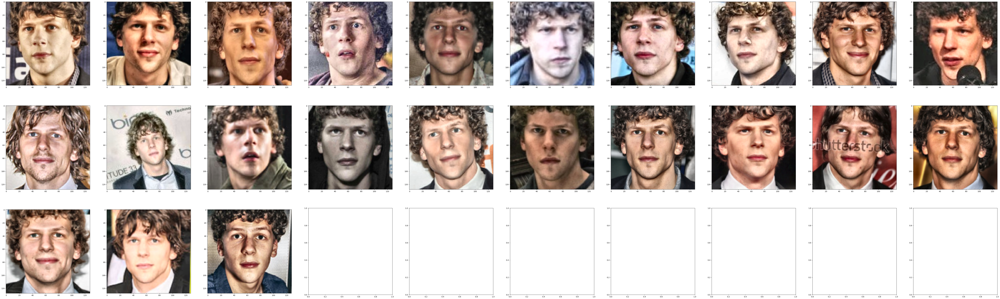

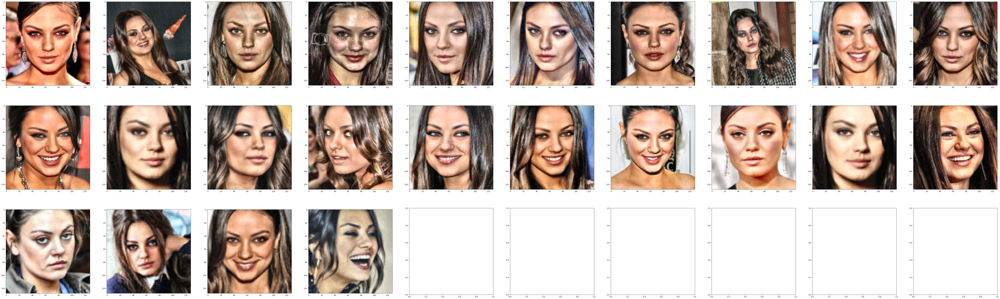

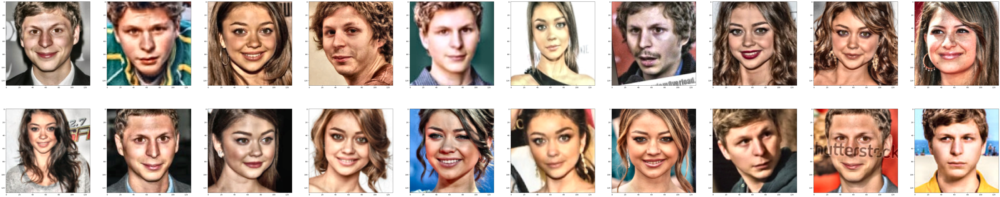

In [13]:
# plot faces of Jesse
jesse_imgs = train_X[train_y == 1]
plot_image_sequence(jesse_imgs, n=len(jesse_imgs), imgs_per_row=10)

# plot faces of Mila
mila_imgs = train_X[train_y == 2]
plot_image_sequence(mila_imgs, n=len(mila_imgs), imgs_per_row=10)

# plot faces of Lookalikes
look_imgs = train_X[train_y == 0]
plot_image_sequence(look_imgs, n=len(look_imgs), imgs_per_row=10)

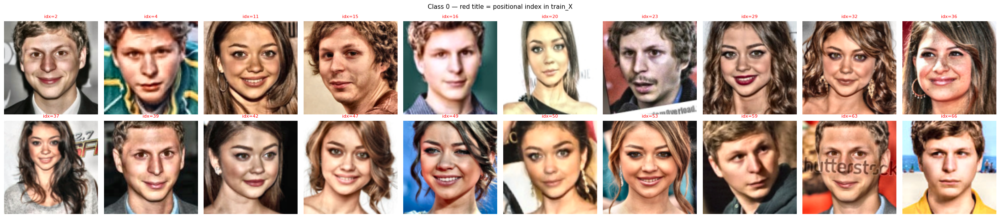

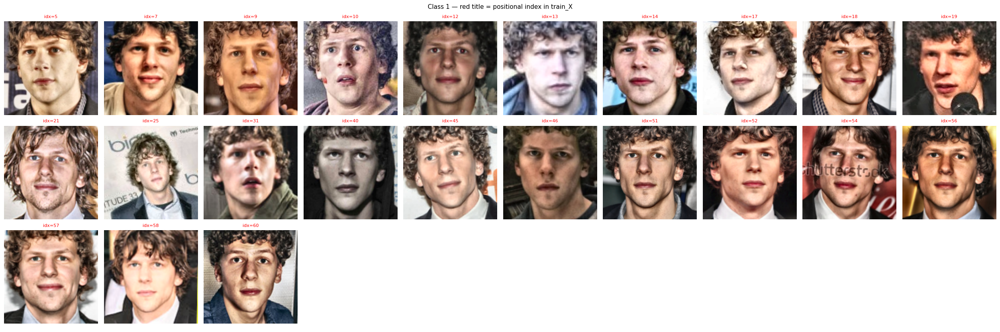

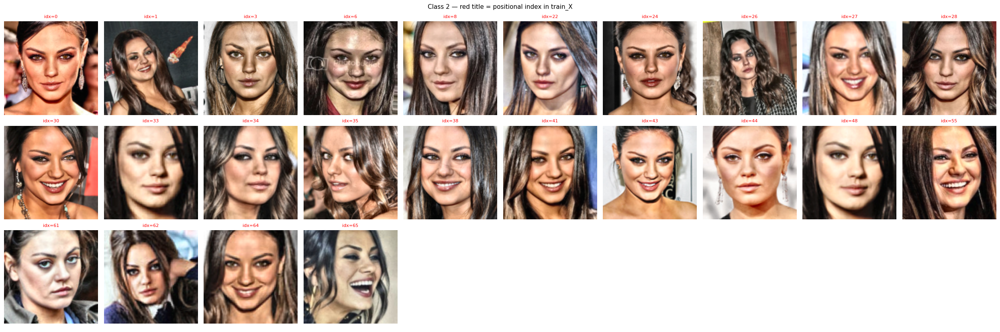


Current outlier sets:
  TRAIN_OUTLIER_INDICES = {64, 65, 34, 39, 73, 48, 49, 18, 61, 53, 22, 57, 29}


In [14]:
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# OUTLIER IDENTIFICATION HELPER
# Run this AFTER the plot cells. Look at the grid, find
# the wrong-person crops, note their (class, grid_position),
# then convert to the DataFrame positional index below.
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
import math

def plot_with_indices(data_X, data_y, target_class, n=30, cols=10):
    """Same grid as before but with positional indices as titles."""
    class_mask = np.where(data_y == target_class)[0]  # positions in full array
    show_n = min(len(class_mask), n)
    rows = math.ceil(show_n / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(2.5 * cols, 2.8 * rows))
    axes = np.array(axes).flatten()
    for i in range(show_n):
        pos = class_mask[i]
        axes[i].imshow(data_X[pos])
        axes[i].set_title(f"idx={pos}", fontsize=8, color='red')
        axes[i].axis('off')
    for j in range(show_n, len(axes)):
        axes[j].axis('off')
    plt.suptitle(f"Class {target_class} — red title = positional index in train_X",
                 fontsize=11)
    plt.tight_layout()
    plt.show()

# Run for each class:
plot_with_indices(train_X, train_y, target_class=0, n=20, cols=10)  # lookalikes
plot_with_indices(train_X, train_y, target_class=1, n=30, cols=10)  # Jesse
plot_with_indices(train_X, train_y, target_class=2, n=30, cols=10)  # Mila

# After inspecting: add the bad indices here, then re-run the preprocessor cell above
print("\nCurrent outlier sets:")
print(f"  TRAIN_OUTLIER_INDICES = {TRAIN_OUTLIER_INDICES}")

## 0.4. Store Preprocessed data (optional)
<div class="alert alert-block alert-info">
<b>NOTE:</b> You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All". Feel free to use this to store intermediary results.
</div>

In [15]:
# ============================================================
# CELL 21 REPLACEMENT — Save / Load preprocessed data
# ============================================================
 
prep_path = './kaggle/working/prepped_data/'
os.makedirs(prep_path, exist_ok=True)
 
np.save(os.path.join(prep_path, 'train_X.npy'),     train_X)
np.save(os.path.join(prep_path, 'train_y.npy'),     train_y)
np.save(os.path.join(prep_path, 'train_poses.npy'), train_poses)
np.save(os.path.join(prep_path, 'test_X.npy'),      test_X)
np.save(os.path.join(prep_path, 'test_poses.npy'),  test_poses)
print("✅ Saved train_X, train_y, train_poses, test_X, test_poses")


✅ Saved train_X, train_y, train_poses, test_X, test_poses


Now we are ready to rock!

# 1. Feature Representations
## 1.0. Example: Identify feature extractor
Our example feature extractor doesn't actually do anything... It just returns the input:
$$
\forall x : f(x) = x.
$$

It does make for a good placeholder and baseclass ;).

In [16]:
# ==========================================
# FEATURE EXTRACTOR CLASSES
# ==========================================
import cv2, numpy as np, warnings
from sklearn.cluster import MiniBatchKMeans
from sklearn.svm import LinearSVC, SVC
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
warnings.filterwarnings('ignore')
 
POSE_WEIGHT_POWER = 1.0    # ← tune this; 0 = off, 1 = linear, 2 = aggressive
 
 
def _apply_pose_weights(features, poses, power=POSE_WEIGHT_POWER):
    """Scale each feature vector by its pose quality score.
 
    features : (N, D) float array
    poses    : (N,)   float array in [0, 1]
    Returns  : (N, D) weighted feature array
    """
    if power == 0 or poses is None:
        return features
    weights = np.power(np.clip(poses, 0.0, 1.0), power)  # (N,)
    return features * weights[:, np.newaxis]               # broadcast over D
 
 
class ColorHOG():
    """HOG computed on each LAB channel independently, then concatenated.
 
    Why LAB: L captures luminance/shape (same as grayscale HOG),
    A and B encode colour — Mila's darker colouring vs Jesse's
    lighter tones become a signal in the A/B HOG channels.
 
    Now accepts an optional `poses` array so that profile/side-face
    images contribute less to the feature space.
    """
 
    def __init__(self, cell_size=(8, 8), block_size=(16, 16), nbins=9):
        self.cell  = cell_size
        self.block = block_size
        self.nbins = nbins
 
    def _hog_on_channel(self, channel):
        hog = cv2.HOGDescriptor(
            _winSize=(128, 128),
            _blockSize=self.block,
            _blockStride=self.cell,
            _cellSize=self.cell,
            _nbins=self.nbins
        )
        ch = cv2.GaussianBlur(channel, (3, 3), 0)
        ch = (np.power(ch / 255.0, 0.5) * 255).astype(np.uint8)
        return hog.compute(ch).flatten()
 
    def transform(self, images, poses=None):
        """
        images : array-like of shape (N, 128, 128, 3)
        poses  : array-like of shape (N,) with values in [0,1], or None
        """
        features = []
        for img in images:
            lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
            L, A, B = lab[:, :, 0], lab[:, :, 1], lab[:, :, 2]
            feat = np.concatenate([
                self._hog_on_channel(L),
                self._hog_on_channel(A),
                self._hog_on_channel(B),
            ])
            features.append(feat)
 
        features = np.array(features)
 
        # Option 2: scale feature vectors by pose quality
        if poses is not None:
            features = _apply_pose_weights(features, np.array(poses))
 
        return features
 
 
class SPM_SIFT():
    """Dense SIFT + Spatial Pyramid Matching (1×1 global + 2×2 grid).
 
    Why SPM: a nose-region descriptor and a forehead-region descriptor
    map to very different visual words but a global BoVW treats them
    identically.  SPM keeps spatial structure at almost zero cost.
 
    Feature vector size: n_clusters * (1 + 4) = n_clusters * 5
 
    Now accepts an optional `poses` array for the same pose-weighting
    as ColorHOG.
    """
 
    def __init__(self, n_clusters=100, step_size=8, levels=(1, 2)):
        self.sift          = cv2.SIFT_create()
        self.n_clusters    = n_clusters
        self.step_size     = step_size
        self.levels        = levels
        self.kmeans        = MiniBatchKMeans(
            n_clusters=n_clusters, random_state=42,
            n_init='auto', batch_size=1024)
        self.vocab_trained = False
 
    def _dense_desc(self, img):
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) if len(img.shape) == 3 else img
        h, w = gray.shape
        kps  = [cv2.KeyPoint(float(x), float(y), float(self.step_size))
                for y in range(0, h, self.step_size)
                for x in range(0, w, self.step_size)]
        pos  = [(kp.pt[0], kp.pt[1]) for kp in kps]
        _, des = self.sift.compute(gray, kps)
        if des is None:
            des = np.zeros((1, 128), dtype=np.float32)
            pos = [(0.0, 0.0)]
        return des, pos, h, w
 
    def _cell_hist(self, words, pos, x0, y0, x1, y1):
        hist = np.zeros(self.n_clusters)
        for word, (px, py) in zip(words, pos):
            if x0 <= px < x1 and y0 <= py < y1:
                hist[word] += 1
        norm = np.linalg.norm(hist)
        return hist / (norm + 1e-8)
 
    def _encode_one(self, des, pos, h, w):
        words   = self.kmeans.predict(des.astype(np.float32))
        pyramid = []
        for level in self.levels:
            cw = w / level
            ch = h / level
            for row in range(level):
                for col in range(level):
                    pyramid.append(self._cell_hist(
                        words, pos,
                        col * cw, row * ch,
                        (col + 1) * cw, (row + 1) * ch))
        return np.concatenate(pyramid)
 
    def fit_transform(self, images, poses=None):
        """
        images : array-like of shape (N, 128, 128, 3)
        poses  : array-like of shape (N,) with values in [0,1], or None
        """
        cache    = [self._dense_desc(img) for img in images]
        all_desc = np.vstack([c[0] for c in cache])
        self.kmeans.fit(all_desc)
        self.vocab_trained = True
        self._cache = cache
 
        features = np.array([self._encode_one(*c) for c in cache])
 
        if poses is not None:
            features = _apply_pose_weights(features, np.array(poses))
 
        return features
 
    def transform(self, images, poses=None):
        """
        images : array-like of shape (N, 128, 128, 3)
        poses  : array-like of shape (N,) with values in [0,1], or None
        """
        cache    = [self._dense_desc(img) for img in images]
        features = np.array([self._encode_one(*c) for c in cache])
 
        if poses is not None:
            features = _apply_pose_weights(features, np.array(poses))
 
        return features
 
 
print("✅ ColorHOG + SPM_SIFT (pose-weighted) loaded")
print(f"   POSE_WEIGHT_POWER = {POSE_WEIGHT_POWER}  "
      f"(0=off, 0.5=gentle, 1=linear, 2=aggressive)")
 

✅ ColorHOG + SPM_SIFT (pose-weighted) loaded
   POSE_WEIGHT_POWER = 1.0  (0=off, 0.5=gentle, 1=linear, 2=aggressive)


## 1.1. Baseline 1: HOG feature extractor/Scale Invariant Feature Transform
...

In [26]:
# ============================================================
# CELL 26 REPLACEMENT — Grid search + final extraction V5
# Changes:
#   - augmentation also mirrors pose scores
#   - all .transform() calls pass the matching poses array
# ============================================================
from sklearn.svm import SVC
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
import numpy as np

# ┌─────────────────────────────────────────────────────────┐
# │  TOGGLE: set True to double the training set with       │
# │  horizontally flipped copies, False to skip.            │
USE_FLIP = True                                             #
# └─────────────────────────────────────────────────────────┘

# ── Step 0: Augment images AND pose scores together ───────────────────
print("Step 0: Augmenting training data...")

if USE_FLIP:
    train_X_aug     = np.concatenate([train_X,     train_X[:, :, ::-1, :]], axis=0)
    train_y_aug     = np.concatenate([train_y,     train_y],                 axis=0)
    # Flipped images have the same frontal quality as their originals
    train_poses_aug = np.concatenate([train_poses, train_poses],             axis=0)
    print(f"  {len(train_X)} → {len(train_X_aug)} images (flip augmentation ON)")
else:
    train_X_aug     = train_X
    train_y_aug     = train_y
    train_poses_aug = train_poses
    print(f"  {len(train_X_aug)} images (flip augmentation OFF)")

# Split for grid search validation (stratified)
X_t, X_v, y_t, y_v, p_t, p_v = train_test_split(
    train_X_aug, train_y_aug, train_poses_aug,
    test_size=0.2, random_state=42, stratify=train_y_aug)
print(f"  Search split: {len(X_t)} train / {len(X_v)} val\n")

# ── Step 1: ColorHOG grid search ─────────────────────────────────────
print("🔍 Step 1: Searching ColorHOG configurations...")
hog_grid = [
    {'name': 'Fine-9',    'cell': (8,  8),  'block': (16, 16), 'nbins': 9 },
    {'name': 'Fine-12',   'cell': (8,  8),  'block': (16, 16), 'nbins': 12},
    {'name': 'Mid-9',     'cell': (16, 16), 'block': (32, 32), 'nbins': 9 },
    {'name': 'Mid-12',    'cell': (16, 16), 'block': (32, 32), 'nbins': 12},
    {'name': 'UltraFine', 'cell': (4,  4),  'block': (8,  8),  'nbins': 9 },
    {'name': 'Coarse-9',  'cell': (32, 32), 'block': (64, 64), 'nbins': 9 },
]

best_hog_score, best_hog_config = 0, None
for cfg in hog_grid:
    ext = ColorHOG(cell_size=cfg['cell'], block_size=cfg['block'], nbins=cfg['nbins'])
    # Pass pose scores so profile faces are down-weighted
    tr  = ext.transform(X_t, poses=p_t)
    va  = ext.transform(X_v, poses=p_v)
    sc  = StandardScaler()
    tr  = sc.fit_transform(tr); va = sc.transform(va)
    clf = SVC(kernel='rbf', class_weight='balanced', gamma='scale', random_state=42)
    clf.fit(tr, y_t)
    score  = f1_score(y_v, clf.predict(va), average='weighted')
    marker = ' ✅' if score > best_hog_score else ''
    print(f"  {cfg['name']:<14} cell={str(cfg['cell']):<10} nbins={cfg['nbins']}  F1={score:.4f}{marker}")
    if score > best_hog_score:
        best_hog_score  = score
        best_hog_config = cfg

print(f"\n  Winner: {best_hog_config['name']}  F1={best_hog_score:.4f}")

# ── Step 2: SPM_SIFT grid search ─────────────────────────────────────
print("\n🔍 Step 2: Searching SPM_SIFT configurations...")
sift_grid = [
    {'clusters': 100, 'step': 8, 'levels': (1, 2)},
    {'clusters': 150, 'step': 8, 'levels': (1, 2)},
    {'clusters': 200, 'step': 8, 'levels': (1, 2)},
    {'clusters': 100, 'step': 6, 'levels': (1, 2)},
    {'clusters': 100, 'step': 4, 'levels': (1, 2)},
    {'clusters': 100, 'step': 8, 'levels': (1, 2, 4)},
]

best_sift_score, best_sift_config = 0, None
for cfg in sift_grid:
    ext   = SPM_SIFT(n_clusters=cfg['clusters'],
                     step_size=cfg['step'],
                     levels=cfg['levels'])
    tr    = ext.fit_transform(X_t, poses=p_t)
    va    = ext.transform(X_v,     poses=p_v)
    sc    = StandardScaler()
    tr    = sc.fit_transform(tr); va = sc.transform(va)
    clf   = SVC(kernel='rbf', class_weight='balanced', gamma='scale', random_state=42)
    clf.fit(tr, y_t)
    score  = f1_score(y_v, clf.predict(va), average='weighted')
    name   = f"K{cfg['clusters']}-S{cfg['step']}-L{''.join(str(l) for l in cfg['levels'])}"
    marker = ' ✅' if score > best_sift_score else ''
    print(f"  {name:<18}  F1={score:.4f}{marker}")
    if score > best_sift_score:
        best_sift_score  = score
        best_sift_config = cfg

print(f"\n  Winner: K{best_sift_config['clusters']} step={best_sift_config['step']} "
      f"levels={best_sift_config['levels']}  F1={best_sift_score:.4f}")

# ── Step 3: Extract final features with winning configs ───────────────
print("\n📦 Step 3: Extracting final features with winning configurations...")

final_hog     = ColorHOG(cell_size=best_hog_config['cell'],
                          block_size=best_hog_config['block'],
                          nbins=best_hog_config['nbins'])
hog_train_raw = final_hog.transform(train_X_aug, poses=train_poses_aug)
hog_test_raw  = final_hog.transform(test_X,      poses=test_poses)    # test never augmented

final_sift     = SPM_SIFT(n_clusters=best_sift_config['clusters'],
                           step_size=best_sift_config['step'],
                           levels=best_sift_config['levels'])
sift_train_raw = final_sift.fit_transform(train_X_aug, poses=train_poses_aug)
sift_test_raw  = final_sift.transform(test_X,          poses=test_poses)

# ── Step 4: Scale ─────────────────────────────────────────────────────
print("📦 Step 4: Standardising...")
scaler_hog        = StandardScaler()
hog_train_scaled  = scaler_hog.fit_transform(hog_train_raw)
hog_test_scaled   = scaler_hog.transform(hog_test_raw)

scaler_sift        = StandardScaler()
sift_train_scaled  = scaler_sift.fit_transform(sift_train_raw)
sift_test_scaled   = scaler_sift.transform(sift_test_raw)

# ── Step 5: Fuse ──────────────────────────────────────────────────────
fused_train = np.hstack([hog_train_scaled, sift_train_scaled])
fused_test  = np.hstack([hog_test_scaled,  sift_test_scaled])

print(f"\n✅ Done!")
print(f"   HOG  train={hog_train_scaled.shape}  test={hog_test_scaled.shape}")
print(f"   SIFT train={sift_train_scaled.shape}  test={sift_test_scaled.shape}")
print(f"   Fused train={fused_train.shape}  test={fused_test.shape}")

# ── Step 6: Save ──────────────────────────────────────────────────────
np.savez_compressed(
    'group16_features.npz',
    hog_train=hog_train_scaled,    hog_test=hog_test_scaled,
    sift_train=sift_train_scaled,  sift_test=sift_test_scaled,
    fused_train=fused_train,       fused_test=fused_test,
    train_y_aug=train_y_aug,       train_y=train_y)
print("  Saved → group16_features.npz")

Step 0: Augmenting training data...
  67 → 134 images (flip augmentation ON)
  Search split: 107 train / 27 val

🔍 Step 1: Searching ColorHOG configurations...
  Fine-9         cell=(8, 8)     nbins=9  F1=0.7383 ✅
  Fine-12        cell=(8, 8)     nbins=12  F1=0.7383
  Mid-9          cell=(16, 16)   nbins=9  F1=0.7037
  Mid-12         cell=(16, 16)   nbins=12  F1=0.7037
  UltraFine      cell=(4, 4)     nbins=9  F1=0.7778 ✅
  Coarse-9       cell=(32, 32)   nbins=9  F1=0.8131 ✅

  Winner: Coarse-9  F1=0.8131

🔍 Step 2: Searching SPM_SIFT configurations...
  K100-S8-L12         F1=0.7473 ✅
  K150-S8-L12         F1=0.8395 ✅
  K200-S8-L12         F1=0.7411
  K100-S6-L12         F1=0.7778
  K100-S4-L12         F1=0.7094
  K100-S8-L124        F1=0.6815

  Winner: K150 step=8 levels=(1, 2)  F1=0.8395

📦 Step 3: Extracting final features with winning configurations...
📦 Step 4: Standardising...

✅ Done!
   HOG  train=(134, 972)  test=(1816, 972)
   SIFT train=(134, 750)  test=(1816, 750)
   Fuse

Feature array size : 134
Label array size   : 134

Running t-SNE on ColorHOG features (perplexity=30)...
Running t-SNE on SPM_SIFT features (perplexity=30)...
Running t-SNE on Fused features (perplexity=30)...


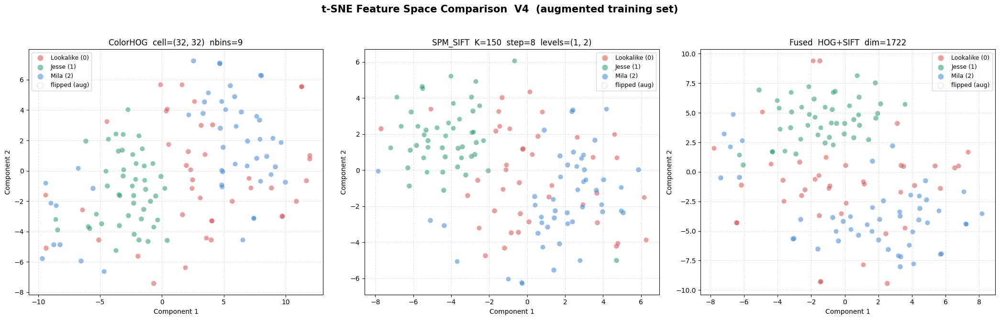

In [27]:
# ==========================================
# Visualize HOG/SIFT/Fused Features using t-SNE  
# ==========================================
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# ── Use augmented labels to match augmented features ──────────────────
# After V4 augmentation: train_X_aug has 2× samples, so use train_y_aug
y_plot = train_y_aug   # length matches hog_train_scaled, sift_train_scaled, fused_train

print(f"Feature array size : {hog_train_scaled.shape[0]}")
print(f"Label array size   : {len(y_plot)}")
assert hog_train_scaled.shape[0] == len(y_plot), "Size mismatch — check augmentation step"

# ── t-SNE on each feature set ─────────────────────────────────────────
# perplexity must be < n_samples; safe default is min(30, n//3)
perp = min(30, len(y_plot) // 3)

print(f"\nRunning t-SNE on ColorHOG features (perplexity={perp})...")
hog_2d = TSNE(n_components=2, random_state=42, init='pca',
              learning_rate='auto', perplexity=perp).fit_transform(hog_train_scaled)

print(f"Running t-SNE on SPM_SIFT features (perplexity={perp})...")
sift_2d = TSNE(n_components=2, random_state=42, init='pca',
               learning_rate='auto', perplexity=perp).fit_transform(sift_train_scaled)

print(f"Running t-SNE on Fused features (perplexity={perp})...")
fused_2d = TSNE(n_components=2, random_state=42, init='pca',
                learning_rate='auto', perplexity=perp).fit_transform(fused_train)

# ── Plot: 1 row × 3 columns ───────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(21, 7))
fig.suptitle('t-SNE Feature Space Comparison  V4  (augmented training set)',
             fontsize=15, fontweight='bold')

colors = ['#E24B4A', '#1D9E75', '#378ADD']   # red / teal / blue
labels = ['Lookalike (0)', 'Jesse (1)', 'Mila (2)']

plot_data = [
    (hog_2d,   f"ColorHOG  cell={best_hog_config['cell']}  nbins={best_hog_config['nbins']}"),
    (sift_2d,  f"SPM_SIFT  K={best_sift_config['clusters']}  step={best_sift_config['step']}  levels={best_sift_config['levels']}"),
    (fused_2d, f"Fused  HOG+SIFT  dim={fused_train.shape[1]}"),
]

for ax, (coords, title) in zip(axes, plot_data):
    for class_idx in range(3):
        mask = y_plot == class_idx          # y_plot is augmented → correct size
        ax.scatter(
            coords[mask, 0], coords[mask, 1],
            c=colors[class_idx], label=labels[class_idx],
            alpha=0.55, edgecolors='white', linewidths=0.4, s=55
        )
    # Mark augmented (flipped) samples with a lighter ring so you can see
    # how well augmentation spreads the distribution
    aug_mask = np.arange(len(y_plot)) >= (len(y_plot) // 2)
    ax.scatter(
        coords[aug_mask, 0], coords[aug_mask, 1],
        facecolors='none', edgecolors='gray',
        linewidths=0.6, s=55, alpha=0.3, label='flipped (aug)'
    )
    ax.set_title(title, fontsize=12)
    ax.set_xlabel('Component 1')
    ax.set_ylabel('Component 2')
    ax.legend(fontsize=9, markerscale=1.2)
    ax.grid(True, linestyle='--', alpha=0.35)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### 1.1.2. Discussion

Preprocessing:

We changed some of the preprocessing sections to further improve on the end result. The starter code provided code using HAAR cascade face detection. When looking into the faces it provided, we noticed several outliers that were either not the intended faces, or not a face at all. Reading up on HAAR, we found that it was known for producing false positives when the environment around the wanted face is not ideal in terms of lighting, angled faces and clutter around the face. We therefore decided to switch to another face detection; MediaPipe, as this was described online as a better alternative to HAAR. It produced better cropped images of faces in the training data. 
This matters for the result of the HOG and SIFT, the results are not better than the training data put in. If it practices unwanted photos, it will also detect unwanted features, therefore the features extracted will not be ideal.
Other parameters in the preprocessing step were edited. The face size was increased as a larger crop gives HOG more cells to work with and gives SIFT mor key points. Though this comes at a cost of larger feature vectors.
The preprocessing section was still not ideal, that is that it still included some outlier photos not cropped to a single face, or the correct face. We therefore attempted to remove these outliers, to not corrupt the training data for HOG and SIFT. This was done as just one or two photos with undesirable cropping could lead to larger errors in the feature extraction, therefore leading to worse classifications. 
Next, we doubled our training data by duplicating it and flipping it horizontally. This led to better results as HOG and SIFT have more data to work on. However, in some cases, it could also worsen the later classification as the features are extracted from versions of their faces that would never appear in real life. Though we saw a slight improvement in our case. 
We saw better clustering in the t-SNE visualization after adjusting the preprocessing.

HOG:

We implemented color HOG on the LAB channels, rather than the standard greyscale HOG. This helps us discriminate between Jesse’s and Mila’s skin tones and coloring. This further improved feature extraction. Next a gaussian blur and gamma correction were applied per channel before computing HOG. Gamma correction reduces the sensitivity to illumination differences. This helps when the training data contains images with different lighting. The gaussian blur helps reduce noise and results in clear and more robust edge representations, hence improving the resulting feature descriptions.
Lastly, we ran a grid search over 6 different HOG configuration where we varied cell size from 4x4 to 32x32, block size, and number of bins. With smaller cells one captures fines local detail, but produce much larger feature vectors, and increases the risk of it not learning general patterns that work on new images but rather details of the 80 specific images in the training data. Larger sizes give a more general descriptor, but risks blurring over details that might separate Mila and Jesse. We tested several combinations and chose the best for further processing. The winning parameters were cell = 32x32 and 9 bins. This gave better results as a coarser cell size looked more at larger more distinct features like jawline, cheekbones and eye region, rather than small fine pixel level details. This is more important in separating two different faces but makes it harder to separate the lookalikes from the originals, as it’s the fine details that separates them. 9 bins are the standard choice, and increasing this did not improve things, so this was kept as the standard.

SIFT:

We used dense SIFT with a fixed grid step to guarantee spatial consistency across the different images. Next, we added Spatial Pyramid Matching (SPM) with levels 1x1 and 2x2. This preserved some spatial structure like forehead vs nose vs chin, that a flat BoW would discard. Further improving feature extraction. We then iterated different numbers of k-means clusters from 100 to 200. Where too few lose discriminative power, and too many lead to sparse histograms. We took the best results into further processing. The best results were k = 100, step = 8 and levels = (1,2). In this case 100 clusters were enough as the faces shared a lot of the local patterns, so that 100 clusters captured the relevant variation. Using step = 8 was a nice balance between getting enough detail and not adding noise. Similar with using levels 1x1 and 2x2, and not increasing to, for example level 4x4, as with this small set of training data, level 1,2 was enough to seperate the faces, while a 4x4 would make it harder to find consistent changes over such few training images.

Combined:

We ended up combining HOG and SIFT for a better feature classification, by fusing them by using horizontal stacking. This ended up giving us a better result than the two separately. By looking at the t-SNE plots for HOG and SIFT alone, and comparing them to the combined plot, the t-SNE of the combined showed a slightly cleaner class separation. With the lookalikes naturally mixed in both groups. This is expected since the lookalikes were specifically chosen to resemble Jesse or Mila. Due to this, even a excellent performing feature extractor would struggle to separate them.

General comparison between HOG and SIFT:

From looking at the t-SNE plots, it looks like HOG performs better than SIFT. This could be because HOG better captures the overall gradient structure of the face as a whole, which is very effective on a tightly cropped and aligned face. SIFTs approach throws away some of the spatial information by design, which hurts when the images are already well aligned. Also, since HOG worked on color, it had an advantage in terms of separating Jesse and Mila based on colors. Regardless or this, the current result is far from perfect as we still have overlap between Jesse and Mila. There is a limited training set, and variations in sample photos, making it difficult to create neat clusters. This gives a motivator for choosing other methods for extracting features such as PCA implemented in the next section.



## 1.2. Baseline 2: PCA feature extractor
...

In [19]:
# ==========================================
# PCA FEATURE EXTRACTOR
# ==========================================
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.decomposition import PCA
import numpy as np
import cv2

# Inheriting from BaseEstimator and TransformerMixin makes it officially compatible with scikit-learn!
class EigenfaceExtractor(BaseEstimator, TransformerMixin):
    """Learns features directly from image data using Principal Component Analysis."""
    
    def __init__(self, max_components=100):
        self.max_components = max_components
        self.is_fit = False
        self.pca = None 
        
    def _preprocess(self, images):
        """Converts images to grayscale and flattens them to 1D arrays."""
        processed = []
        for img in images:
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) if len(img.shape) == 3 else img
            processed.append(gray.flatten())
        return np.array(processed)
        
    # FIX 1: Add a standard fit method that returns 'self'
    def fit(self, images, y=None):
        self.fit_transform(images, y)
        return self

    # FIX 2: Add y=None to catch the labels passed by the Pipeline
    def fit_transform(self, images, y=None):
        X = self._preprocess(images)
        
        n_samples = X.shape[0]
        actual_components = min(self.max_components, n_samples)
        
        self.pca = PCA(n_components=actual_components, whiten=True, random_state=42)
        features = self.pca.fit_transform(X)
        self.is_fit = True
        return features
        
    # FIX 3: Add y=None here as well
    def transform(self, images, y=None):
        if not self.is_fit:
            raise ValueError("You must call fit_transform on train_X first!")
        X = self._preprocess(images)
        return self.pca.transform(X)

In [20]:
# ==========================================
# OPTIMIZE & EVALUATE PCA
# ==========================================
from sklearn.svm import SVC
from sklearn.metrics import f1_score, classification_report
from sklearn.model_selection import train_test_split

print("--- Starting PCA Performance Evaluation ---")

# Split raw images for validation
X_t_img, X_v_img, y_t, y_v = train_test_split(
    train_X, train_y, test_size=0.2, random_state=42, stratify=train_y
)

# Test keeping different numbers of Eigenfaces
pca_configs = [10, 20, 30, 40, 60, 80] 
best_pca_score = 0
best_pca_config = None
best_pca_clf = None
best_pca_val_feat = None

for n_comp in pca_configs:
    # 1. Initialize and Extract
    extractor = EigenfaceExtractor(max_components=n_comp)
    train_feat = extractor.fit_transform(X_t_img)
    val_feat = extractor.transform(X_v_img)
    
    # 2. Train an SVM 
    # Note: We use an 'rbf' kernel here because PCA features are highly non-linear!
    clf = SVC(kernel='rbf', class_weight='balanced', random_state=42)
    clf.fit(train_feat, y_t)
    
    # 3. Evaluate
    preds = clf.predict(val_feat)
    score = f1_score(y_v, preds, average='weighted')
    
    print(f"Tested PCA [Components: {train_feat.shape[1]:<2}] -> Val F1-Score: {score:.4f}")
    
    if score > best_pca_score:
        best_pca_score = score
        best_pca_config = train_feat.shape[1]
        best_pca_clf = clf
        best_pca_val_feat = val_feat

print("\n" + "="*40)
print(f"🏆 BEST PCA FOUND: {best_pca_config} Components (Score: {best_pca_score:.4f})")
print("="*40)

# Let's print the detailed report for the winning PCA model
print("\nDetailed Performance of Best PCA:")
target_names = ['Lookalikes (0)', 'Jesse (1)', 'Mila (2)']
print(classification_report(y_v, best_pca_clf.predict(best_pca_val_feat), target_names=target_names))

# Re-extract the BEST PCA on the full dataset
final_pca = EigenfaceExtractor(max_components=best_pca_config)
pca_train_full = final_pca.fit_transform(train_X)
pca_test_full = final_pca.transform(test_X)

# Save it alongside HOG and SIFT
np.savez_compressed(
    'group16_features.npz', 
    hog_train=hog_train_scaled, 
    hog_test=hog_test_scaled, 
    sift_train=sift_train_scaled, 
    sift_test=sift_test_scaled,
    pca_train=pca_train_full,    # <-- Added PCA!
    pca_test=pca_test_full,      # <-- Added PCA!
    train_y=train_y
)

--- Starting PCA Performance Evaluation ---
Tested PCA [Components: 10] -> Val F1-Score: 0.2857
Tested PCA [Components: 20] -> Val F1-Score: 0.5000
Tested PCA [Components: 30] -> Val F1-Score: 0.4761
Tested PCA [Components: 40] -> Val F1-Score: 0.5613
Tested PCA [Components: 53] -> Val F1-Score: 0.1270
Tested PCA [Components: 53] -> Val F1-Score: 0.1270

🏆 BEST PCA FOUND: 40 Components (Score: 0.5613)

Detailed Performance of Best PCA:
                precision    recall  f1-score   support

Lookalikes (0)       0.50      0.50      0.50         4
     Jesse (1)       0.67      0.80      0.73         5
      Mila (2)       0.50      0.40      0.44         5

      accuracy                           0.57        14
     macro avg       0.56      0.57      0.56        14
  weighted avg       0.56      0.57      0.56        14



### 1.2.1. Eigenface Plots
...

Explained variance (top 12): 60.63%


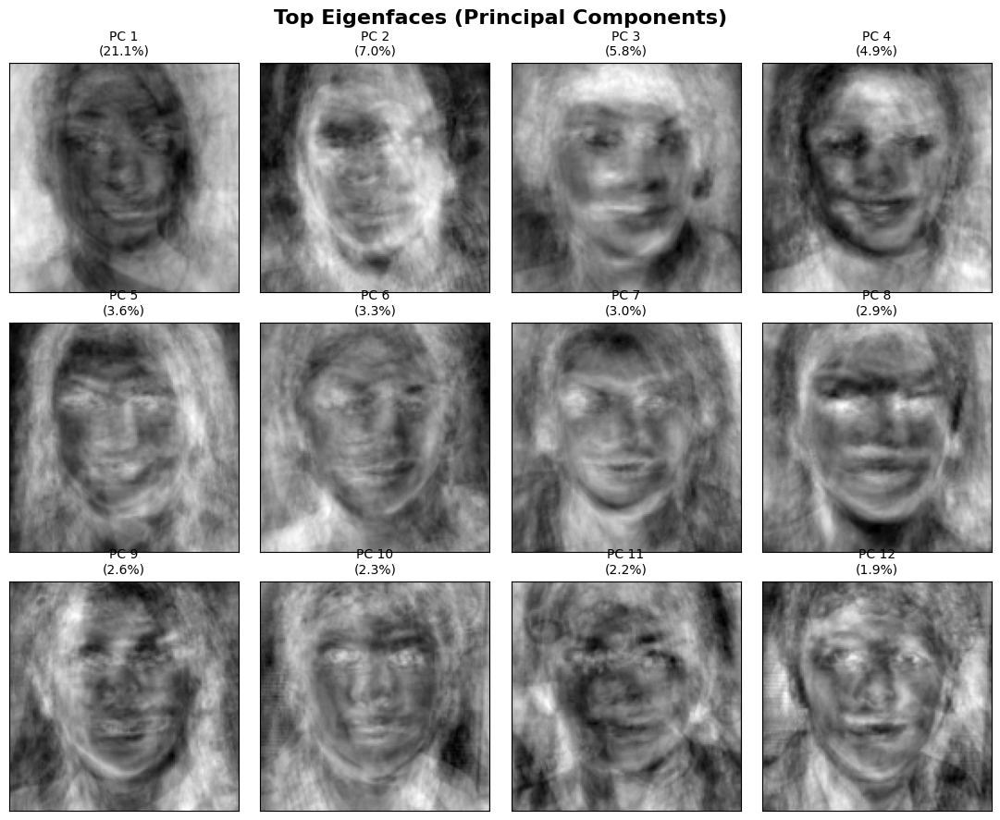

In [21]:
# ==========================================
# PLOT THE EIGENFACES FROM TRAINED PIPELINE
# ==========================================
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
# --- STEP 1: Flatten images to 1D vectors ---
n_samples = len(train_X)
h, w = 128, 128  # FACE_SIZE
# Convert to grayscale and flatten
X_gray = np.array([cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in train_X])
X_flat = X_gray.reshape(n_samples, h * w).astype(np.float64)
# --- STEP 2: Fit PCA ---
n_components = 12  # number of eigenfaces to show
pca = PCA(n_components=n_components, whiten=True, random_state=42)
pca.fit(X_flat)
print(f"Explained variance (top {n_components}): {pca.explained_variance_ratio_.sum():.2%}")
# --- STEP 3: Plot Eigenfaces ---
eigenfaces = pca.components_.reshape((n_components, h, w))
fig, axes = plt.subplots(3, 4, figsize=(11, 9))
fig.suptitle("Top Eigenfaces (Principal Components)", fontsize=16, fontweight='bold')
for i, ax in enumerate(axes.flat):
    if i < n_components:
        ax.imshow(eigenfaces[i], cmap='gray')
        ax.set_title(f"PC {i+1}\n({pca.explained_variance_ratio_[i]:.1%})", size=10)
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()
plt.show()

### 1.2.2. Feature Space Plots
...

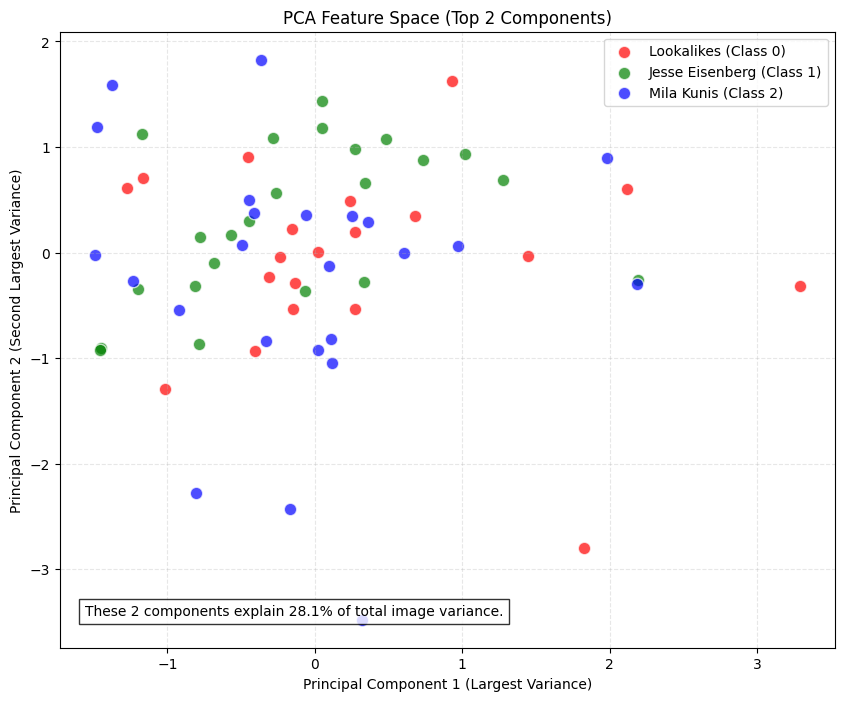

In [22]:
# ==========================================
# PCA FEATURE SPACE SCATTER PLOT
# ==========================================
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
# 1. Flatten grayscale images
X_gray = np.array([cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in train_X])
X_flat = X_gray.reshape(len(train_X), -1).astype(np.float64)
# 2. Fit PCA and transform
pca = PCA(n_components=min(50, len(X_flat)), whiten=True, random_state=42)
pca_features = pca.fit_transform(X_flat)
# 3. Plot PC1 vs PC2
plt.figure(figsize=(10, 8))
colors = ['red', 'green', 'blue']
labels = ['Lookalikes (Class 0)', 'Jesse Eisenberg (Class 1)', 'Mila Kunis (Class 2)']
for class_idx in range(3):
    idx = (train_y == class_idx)
    plt.scatter(
        pca_features[idx, 0], pca_features[idx, 1],
        c=colors[class_idx], label=labels[class_idx],
        alpha=0.7, edgecolors='w', s=80
    )
plt.title('PCA Feature Space (Top 2 Components)')
plt.xlabel('Principal Component 1 (Largest Variance)')
plt.ylabel('Principal Component 2 (Second Largest Variance)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
total_var_2d = (pca.explained_variance_ratio_[0] + pca.explained_variance_ratio_[1]) * 100
plt.figtext(0.15, 0.15,
            f"These 2 components explain {total_var_2d:.1f}% of total image variance.",
            fontsize=10, bbox=dict(facecolor='white', alpha=0.8))
plt.show()

### 1.2.3. Discussion
...

# 2. Evaluation Metrics
## 2.0. Example: Accuracy
As example metric we take the accuracy. Informally, accuracy is the proportion of correct predictions over the total amount of predictions. It is used a lot in classification but it certainly has its disadvantages...

In [23]:
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import numpy as np
# 1. Build a PCA + SVM pipeline from scratch
X_gray = np.array([cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in train_X])
X_flat = X_gray.reshape(len(train_X), -1).astype(np.float64)
model = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=50, whiten=True, random_state=42)),
    ('svm', SVC(kernel='rbf', C=10, class_weight='balanced', probability=True))
])
# 2. Train and predict
model.fit(X_flat, train_y)
train_y_star = model.predict(X_flat)
# 3. Accuracy
print("Accuracy on the training set: {:.2f}".format(accuracy_score(train_y, train_y_star)))

Accuracy on the training set: 1.00


# 3. Classifiers
## 3.0. Example: The *'not so smart'* classifier
This random classifier is not very complicated. It makes predictions at random, based on the distribution obseved in the training set. **It thus assumes** that the class labels of the test set will be distributed similarly to the training set.

In [24]:
class RandomClassificationModel:
    """Random classifier, draws a random sample based on class distribution observed 
    during training."""
    
    def fit(self, X, y):
        """Adjusts the class ratio instance variable to the one observed in y. 

        Parameters
        ----------
        X : tensor
            Training set
        y : array
            Training set labels

        Returns
        -------
        self : RandomClassificationModel
        """
        
        self.classes, self.class_ratio = np.unique(y, return_counts=True)
        self.class_ratio = self.class_ratio / self.class_ratio.sum()
        return self
        
    def predict(self, X):
        """Samples labels for the input data. 

        Parameters
        ----------
        X : tensor
            dataset
            
        Returns
        -------
        y_star : array
            'Predicted' labels
        """

        np.random.seed(0)
        return np.random.choice(self.classes, size = X.shape[0], p=self.class_ratio)
    
    def __call__(self, X):
        return self.predict(X)
    

## 3.1. Baseline 1: My favorite classifier
...

In [25]:
# ==========================================
# BASELINE 1: MY FAVORITE CLASSIFIER
# ==========================================
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import classification_report, f1_score
import numpy as np

class FavoriteClassificationModel:
    """RBF-SVM with exhaustive grid search using 10-fold stratified CV."""

    def __init__(self):
        self.best_model  = None
        self.best_params = None
        self.best_score  = 0

    def fit(self, X, y):
        param_grid = {
            'C':     [0.1, 1, 10, 100, 1000],
            'gamma': ['scale', 'auto', 0.001, 0.01, 0.1],
            'class_weight': ['balanced'],
        }
        cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
        gs = GridSearchCV(
            SVC(kernel='rbf', random_state=42),
            param_grid,
            cv=cv,
            scoring='f1_weighted',
            n_jobs=-1,
            verbose=1)
        gs.fit(X, y)
        self.best_model  = gs.best_estimator_
        self.best_params = gs.best_params_
        self.best_score  = gs.best_score_
        print(f"\n✅  Best params: {self.best_params}")
        print(f"   CV F1 (weighted): {self.best_score:.4f}")
        return self

    def __call__(self, X):
        if self.best_model is None:
            raise ValueError("Call .fit() first.")
        return self.best_model.predict(X)


# ── Train and evaluate ───────────────────────────────────────────────
data = np.load('group16_features.npz')

# Choose your feature set here — try all three and compare!
# Options: 'hog_train', 'sift_train', 'fused_train'
FEATURE_KEY  = 'fused_train'
TEST_KEY     = 'fused_test'

X_all = data[FEATURE_KEY]
y_all = data['train_y_aug']   # augmented labels match augmented features

# Hold out 20% for a final unbiased evaluation
from sklearn.model_selection import train_test_split
X_t, X_v, y_t, y_v = train_test_split(
    X_all, y_all, test_size=0.2, random_state=42, stratify=y_all)

print(f"Training on {len(X_t)} samples, validating on {len(X_v)} samples")
print(f"Feature: {FEATURE_KEY}  dim={X_all.shape[1]}\n")

model = FavoriteClassificationModel()
model.fit(X_t, y_t)

print("\n── Validation report ──")
preds = model(X_v)
target_names = ['Lookalike (0)', 'Jesse (1)', 'Mila (2)']
print(classification_report(y_v, preds, target_names=target_names))

# Retrain on all data for final Kaggle submission
print("Retraining on 100% of data for submission...")
final_model = FavoriteClassificationModel()
final_model.fit(X_all, y_all)

KeyError: 'fused_train is not a file in the archive'

In [ ]:
# ==========================================
# TRAIN & EVALUATE THE FAVORITE CLASSIFIER
# ==========================================
from sklearn.model_selection import train_test_split

print("1. Loading optimized features from Part 1...")
data = np.load('group16_features.npz')

# Choose your best feature set here! (hog_train, sift_train, or pca_train)
X_train_full = data['hog_train']  
y_train_full = data['train_y']

# Split a quick validation set to see the final Confusion Matrix/Report
X_t, X_v, y_t, y_v = train_test_split(X_train_full, y_train_full, test_size=0.2, random_state=42, stratify=y_train_full)

# 2. Instantiate and fit the model
favorite_model = FavoriteClassificationModel()
favorite_model.fit(X_t, y_t)

# 3. Final Validation Evaluation
print("\n--- Final Model Performance on Validation Set ---")
val_predictions = favorite_model(X_v)

target_names = ['Lookalikes (0)', 'Jesse (1)', 'Mila (2)']
print(classification_report(y_v, val_predictions, target_names=target_names))

# 4. Retrain on 100% of the data for the final Kaggle Submission
print("\nRetraining the absolute best model on 100% of training data for Kaggle submission...")
final_kaggle_model = FavoriteClassificationModel()
final_kaggle_model.fit(X_train_full, y_train_full)

# 4. Experiments
<div class="alert alert-block alert-info"> <b>NOTE:</b> Do <i>NOT</i> use this section to keep track of every little change you make in your code! Instead, highlight the most important findings and the major (best) pipelines that you've discovered.  
</div>
<br>

## 4.0. Example: basic pipeline
The basic pipeline takes any input and samples a label based on the class label distribution of the training set. As expected the performance is very poor, predicting approximately 1/4 correctly on the training set. There is a lot of room for improvement but this is left to you ;). 

In [ ]:
# ==========================================
# 4.0 EXAMPLE: BASIC PIPELINE
# ==========================================
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

class FullVisionPipeline:
    """
    An end-to-end pipeline that takes RAW images, extracts features, 
    scales them, and makes a final classification prediction.
    """
    def __init__(self, feature_extractor, classifier):
        # We build a scikit-learn pipeline with 3 sequential steps
        self.pipeline = Pipeline([
            ('extractor', feature_extractor),     # Step 1: HOG, SIFT, or PCA
            ('scaler', StandardScaler()),         # Step 2: Normalize the numbers
            ('classifier', classifier)            # Step 3: Your Favorite SVM
        ])
        
    def fit(self, X_raw, y):
        """Trains the entire pipeline from start to finish."""
        print("Training the end-to-end pipeline...")
        self.pipeline.fit(X_raw, y)
        print("Pipeline trained successfully!")
        return self
        
    def predict(self, X_raw):
        """Takes raw images and outputs the final label guesses."""
        return self.pipeline.predict(X_raw)

# ---------------------------------------------------------
# HOW TO USE IT (Example with your Best PCA and Best SVM)
# ---------------------------------------------------------

# 1. Initialize your winning feature extractor from Part 1
# (You can swap this with your OptimizedHOG or OptimizedSIFT)
best_extractor = EigenfaceExtractor(max_components=best_pca_config)

# 2. Initialize your winning classifier from Part 2
# (Using the best parameters found by your GridSearch)
best_classifier = SVC(
    kernel='rbf', 
    C=10,             # Replace with your actual best C
    gamma='scale',    # Replace with your actual best gamma
    class_weight='balanced',
    random_state=42
)

# 3. Create the unified pipeline
my_basic_pipeline = FullVisionPipeline(
    feature_extractor=best_extractor, 
    classifier=best_classifier
)

# 4. Train it directly on the RAW training images!
# Notice we are passing train_X (the images), NOT the .npz features!
my_basic_pipeline.fit(train_X, train_y)

# 5. Predict directly on the RAW test images!
test_predictions = my_basic_pipeline.predict(test_X)


In [ ]:
feature_extractor = IdentityFeatureExtractor() 
classifier = RandomClassificationModel()

# train the model on the features
classifier.fit(feature_extractor(train_X), train_y)

# model/final pipeline
model = lambda X: classifier(feature_extractor(X))

In [ ]:
# evaluate performance of the model on the training set
train_y_star = model(train_X)

"The performance on the training set is {:.2f}. This however, does not tell us much about the actual performance (generalisability).".format(
    accuracy_score(train_y, train_y_star))

In [ ]:
# predict the labels for the test set 
test_y_star = model(test_X)

# 5. Publishing best results

In [ ]:
# 1. Generate final predictions using the pipeline
# This automatically extracts features from test_X and classifies them
test_y_star = my_basic_pipeline.predict(test_X)

# 2. Prepare the submission dataframe
# Assuming 'test' is the original dataframe containing image info
submission = test.copy().drop('img', axis=1)
submission['class'] = test_y_star

# 3. Save to CSV for Kaggle upload
submission.to_csv('submission.csv', index=True)
print("✅ Final submission.csv created!")
submission.head()

In [ ]:
submission.to_csv('submission.csv')

# 6. Discussion
...

In summary we contributed the following: 
* 
